## IMPORT LIBRARIES 🎬

In [1]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [2]:
# Data manipulation and processing
import numpy as np               
import pandas as pd    

# Visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg


# File handling and operations
import os
import random
import pickle

# TensorFlow and Keras Libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import (
    matthews_corrcoef, accuracy_score, precision_score, recall_score, f1_score,
    cohen_kappa_score, brier_score_loss, log_loss, balanced_accuracy_score,
    fbeta_score, jaccard_score, hamming_loss, confusion_matrix, roc_curve, auc
)
from sklearn.preprocessing import label_binarize
from itertools import cycle

2025-05-19 15:50:38.475059: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747669838.671596      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747669838.734350      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# Mixed Precision
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')  # Enables mixed precision training

# Suppress TensorFlow logging
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppresses most of TensorFlow's logging messages

In [4]:
classes = os.listdir('/kaggle/input/plantdisease/PlantVillage')
print(classes)

['Pepper__bell___Bacterial_spot', 'Potato___healthy', 'Tomato_Leaf_Mold', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato_Bacterial_spot', 'Tomato_Septoria_leaf_spot', 'Tomato_healthy', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato_Early_blight', 'Tomato__Target_Spot', 'Pepper__bell___healthy', 'Potato___Late_blight', 'Tomato_Late_blight', 'Potato___Early_blight', 'Tomato__Tomato_mosaic_virus']


## LOAD DATASET

In [5]:
def make_pandas_dataset(base_dir:str,classes:list):
    image_paths = []
    labels = []

    for cls in classes:
        class_dir = os.path.join(base_dir, cls)
        for img_name in os.listdir(class_dir):
            image_paths.append(os.path.join(class_dir, img_name))
            labels.append(cls)

    return pd.DataFrame({'image_path': image_paths, 'label': labels})

In [6]:
%%time
base_dir = '/kaggle/input/plantdisease/PlantVillage'
df = make_pandas_dataset(base_dir,classes)

CPU times: user 25.9 ms, sys: 33.3 ms, total: 59.2 ms
Wall time: 1.6 s


In [7]:
df.head()

,image_path,label
0,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
1,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
2,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
3,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
4,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot


In [8]:
df.tail()

,image_path,label
20634,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato__Tomato_mosaic_virus
20635,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato__Tomato_mosaic_virus
20636,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato__Tomato_mosaic_virus
20637,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato__Tomato_mosaic_virus
20638,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato__Tomato_mosaic_virus


In [9]:
count = df['label'].value_counts()
count

label
Tomato__Tomato_YellowLeaf__Curl_Virus          3209
Tomato_Bacterial_spot                          2127
Tomato_Late_blight                             1909
Tomato_Septoria_leaf_spot                      1771
Tomato_Spider_mites_Two_spotted_spider_mite    1676
Tomato_healthy                                 1591
Pepper__bell___healthy                         1478
Tomato__Target_Spot                            1404
Tomato_Early_blight                            1000
Potato___Early_blight                          1000
Potato___Late_blight                           1000
Pepper__bell___Bacterial_spot                   997
Tomato_Leaf_Mold                                952
Tomato__Tomato_mosaic_virus                     373
Potato___healthy                                152
Name: count, dtype: int64

In [10]:
len(count)

15

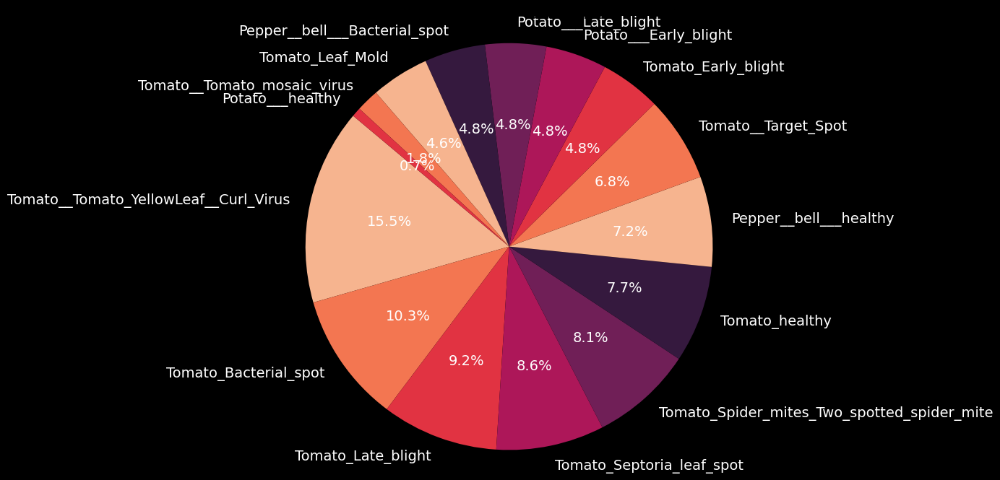

In [11]:
# Ayarlar
plt.figure(figsize=(8, 8), facecolor='black')
palette = sns.color_palette("rocket_r") # https://seaborn.pydata.org/tutorial/color_palettes.html
sns.set_palette(palette)

# Pie Chart
# plt.pie(count, labels=count.index, autopct='%1.1f%%', startangle=140, colors=palette)
plt.pie(
    count,
    labels=count.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=palette,
    textprops={'color': 'white', 'fontsize': 14}  # Yazı rengi ve boyutu
)
plt.title('Distribution of Categories', fontsize=16)
plt.axis('equal')  # Daire şeklinde olmasını sağlar
plt.show()

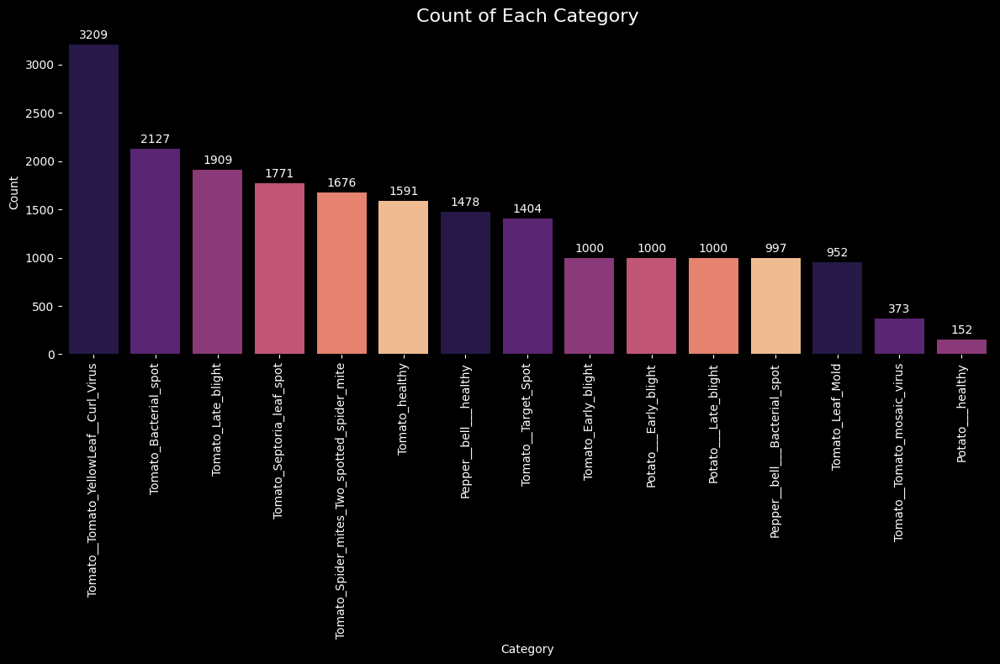

In [12]:
# Ayarlar
plt.figure(figsize=(12, 8), facecolor='black')
palette = sns.color_palette("magma")
sns.set_palette(palette)

# Bar Chart
ax = sns.barplot(x=count.index, y=count.values, palette=palette)

# Başlık ve etiketler - beyaz
ax.set_title('Count of Each Category', fontsize=16, color='white')
ax.set_xlabel('Category', color='white')
ax.set_ylabel('Count', color='white')

# X ve Y ekseni yazıları beyaz
ax.tick_params(axis='x', colors='white', rotation=90)
ax.tick_params(axis='y', colors='white')

# Çubukların üstüne beyaz sayı yaz
for i, val in enumerate(count.values):
    ax.text(i, val + max(count.values)*0.01, str(val), ha='center', va='bottom', fontsize=10, color='white')

# Arka planları da siyah yap
ax.set_facecolor('black')
plt.gcf().patch.set_facecolor('black')

plt.tight_layout()
plt.show()


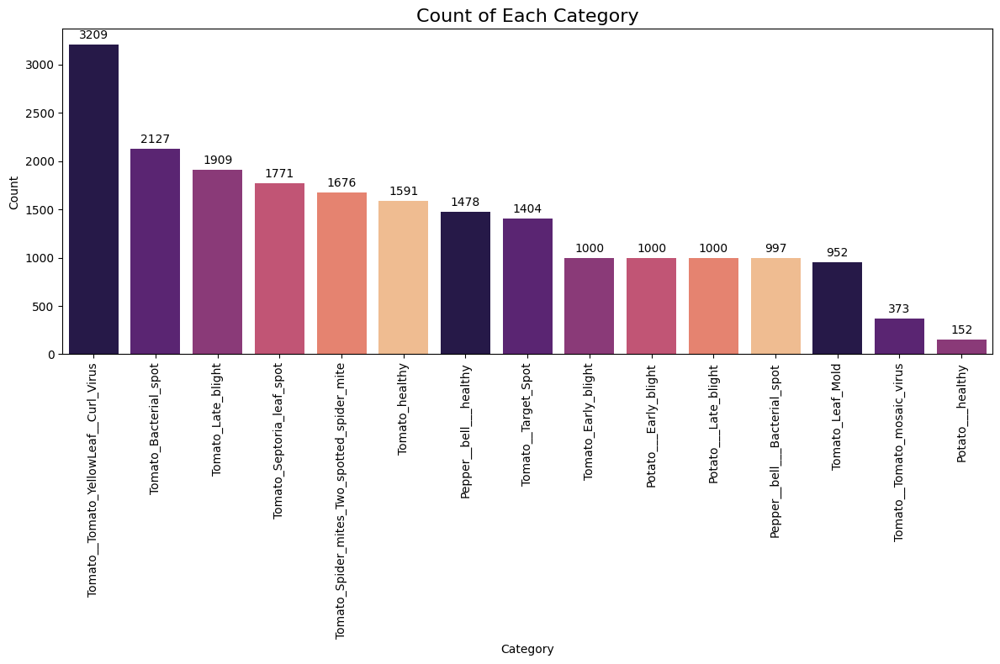

In [13]:
# Ayarlar
plt.figure(figsize=(12, 8), facecolor='white')
palette = sns.color_palette("magma") # https://seaborn.pydata.org/tutorial/color_palettes.html
sns.set_palette(palette)

# Bar Chart
ax = sns.barplot(x=count.index, y=count.values, palette=palette)
ax.set_title('Count of Each Category', fontsize=16)
ax.set_xlabel('Category')
ax.set_ylabel('Count')
ax.tick_params(axis='x', rotation=90)

# Sayıları çubukların üstüne yaz
for i, val in enumerate(count.values):
    ax.text(i, val + max(count.values)*0.01, str(val), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [14]:
def show_image_grid(df, classes, title='Class Samples', images_per_class=3):
    fig, axes = plt.subplots(len(classes), images_per_class, figsize=(images_per_class * 3, len(classes) * 3), constrained_layout=True)
    fig.suptitle(title, fontsize=18)

    for i, label in enumerate(classes):
        class_data = df[df['label'] == label]
        num_images_to_show = min(images_per_class, len(class_data))

        sample_images = random.sample(list(class_data['image_path']), num_images_to_show) if num_images_to_show > 0 else []

        for j in range(images_per_class):
            ax = axes[i, j] if len(classes) > 1 else axes[j]  # tek satır olursa düzelt
            if j < num_images_to_show:
                img = mpimg.imread(sample_images[j])
                ax.imshow(img, cmap='gray')
                ax.set_title(label, fontsize=10)
            ax.axis('off')

In [15]:
# Grupları belirle
tomato_classes = [c for c in df['label'].unique() if 'Tomato' in c]
potato_classes = [c for c in df['label'].unique() if 'Potato' in c]
pepper_classes = [c for c in df['label'].unique() if 'Pepper' in c]

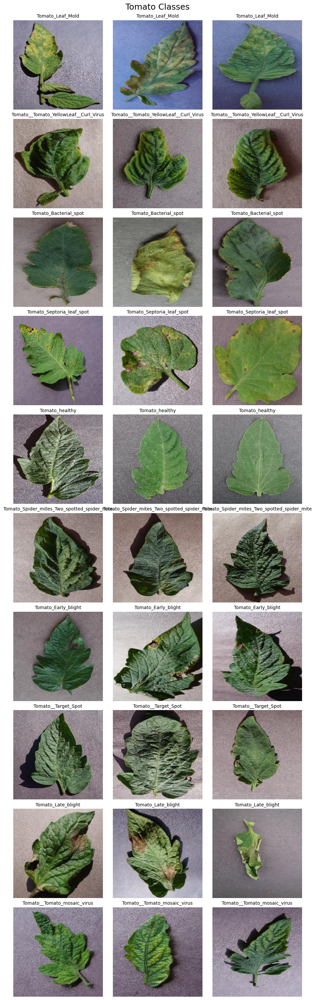

In [16]:
# Tomato görselleri
show_image_grid(df, tomato_classes, title='Tomato Classes')

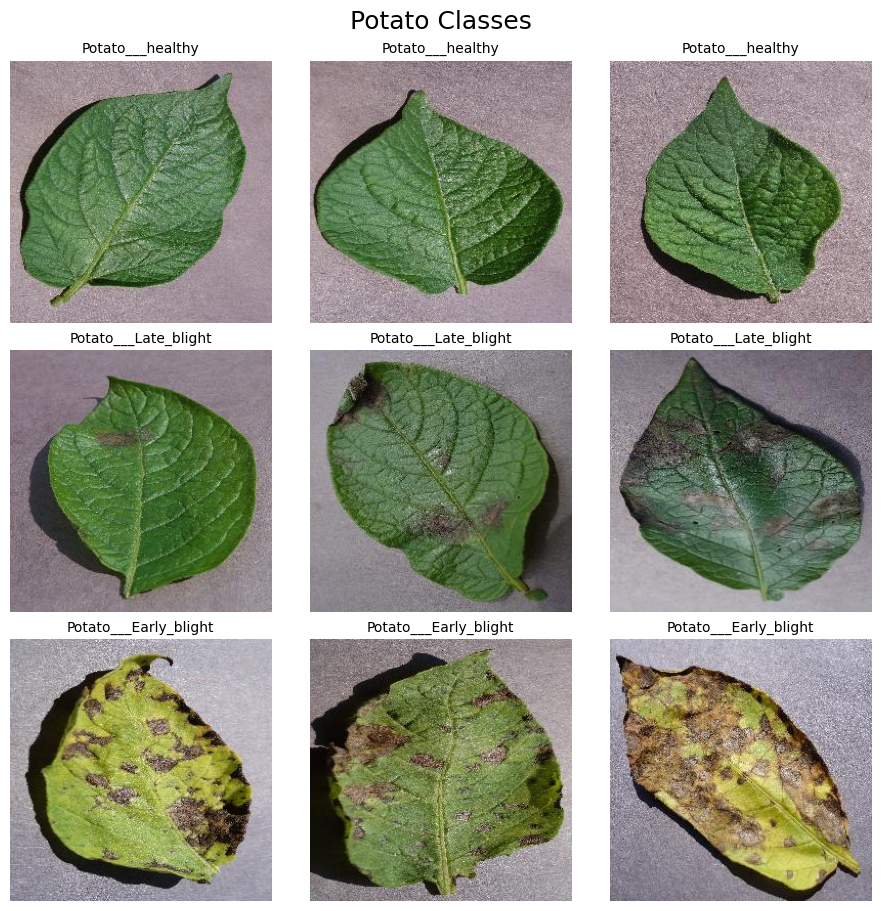

In [17]:
# Potato görselleri
show_image_grid(df, potato_classes, title='Potato Classes')

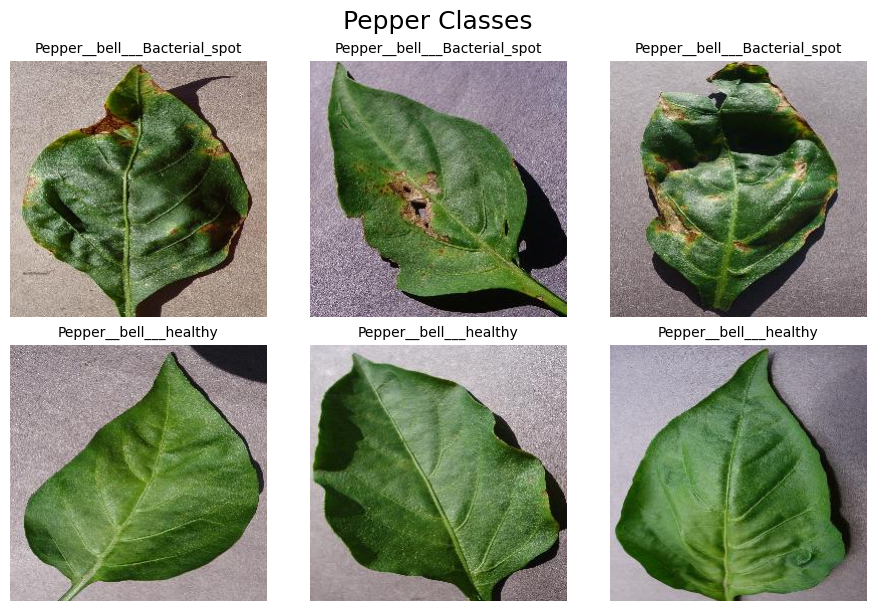

In [18]:
# Pepper görselleri
show_image_grid(df, pepper_classes, title='Pepper Classes')

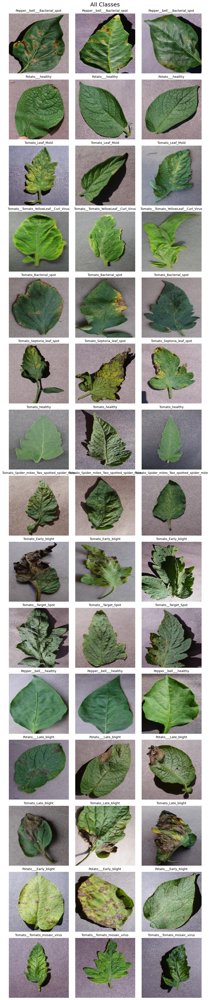

In [19]:
all_classes = df['label'].unique()
show_image_grid(df, all_classes, title='All Classes')

In [20]:
from sklearn.model_selection import train_test_split
train_df, temp_df = train_test_split(df, test_size=0.2, stratify=df['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label'])

print(f"Train Set: {len(train_df)} | Validation Set: {len(val_df)} | Test Set: {len(test_df)}")

Train Set: 16511 | Validation Set: 2064 | Test Set: 2064


In [21]:
total = len(df)
print(f"Train: %{len(train_df) / total * 100:.1f}")
print(f"Test: %{len(test_df) / total * 100:.1f}")
print(f"Validation: %{len(val_df) / total * 100:.1f}")

Train: %80.0
Test: %10.0
Validation: %10.0


In [22]:
print("\nTraining set class distribution:")
print(train_df['label'].value_counts(normalize=True))
print(train_df['label'].value_counts())

print("\nTesting set class distribution:")
print(test_df['label'].value_counts(normalize=True))
print(test_df['label'].value_counts())

print("\nValidation set class distribution:")
print(val_df['label'].value_counts(normalize=True))
print(val_df['label'].value_counts())


Training set class distribution:
label
Tomato__Tomato_YellowLeaf__Curl_Virus          0.155472
Tomato_Bacterial_spot                          0.103022
Tomato_Late_blight                             0.092484
Tomato_Septoria_leaf_spot                      0.085822
Tomato_Spider_mites_Two_spotted_spider_mite    0.081219
Tomato_healthy                                 0.077100
Pepper__bell___healthy                         0.071589
Tomato__Target_Spot                            0.068015
Potato___Late_blight                           0.048453
Potato___Early_blight                          0.048453
Tomato_Early_blight                            0.048453
Pepper__bell___Bacterial_spot                  0.048331
Tomato_Leaf_Mold                               0.046151
Tomato__Tomato_mosaic_virus                    0.018049
Potato___healthy                               0.007389
Name: proportion, dtype: float64
label
Tomato__Tomato_YellowLeaf__Curl_Virus          2567
Tomato_Bacterial_spot        

In [23]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

train_df['encoded_labels'] = label_encoder.fit_transform(train_df['label'])
val_df['encoded_labels'] = label_encoder.transform(val_df['label'])
test_df['encoded_labels'] = label_encoder.transform(test_df['label'])

print(train_df.head())

                                              image_path  \
9919   /kaggle/input/plantdisease/PlantVillage/Tomato...   
18287  /kaggle/input/plantdisease/PlantVillage/Tomato...   
6415   /kaggle/input/plantdisease/PlantVillage/Tomato...   
17753  /kaggle/input/plantdisease/PlantVillage/Tomato...   
14085  /kaggle/input/plantdisease/PlantVillage/Tomato...   

                       label  encoded_labels  
9919          Tomato_healthy              14  
18287     Tomato_Late_blight               7  
6415   Tomato_Bacterial_spot               5  
17753     Tomato_Late_blight               7  
14085    Tomato__Target_Spot              11  


In [24]:
train_df['encoded_labels'] = train_df['encoded_labels'].astype(str)
test_df['encoded_labels'] = test_df['encoded_labels'].astype(str)
val_df['encoded_labels'] = val_df['encoded_labels'].astype(str)

In [25]:
from skimage import exposure

def custom_preprocessing(image):
    # Rastgele kontrast ayarı
    image = exposure.adjust_gamma(image, gamma=np.random.uniform(0.8, 1.2))
    return image

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=40,               # Açısal dönüş
    width_shift_range=0.3,           # Yatay kayma
    height_shift_range=0.3,          # Dikey kayma
    shear_range=0.3,                 # Kesme (shearing)
    zoom_range=0.3,                  # Yakınlaştırma
    horizontal_flip=True,            # Ayna
    vertical_flip=True,              # Dikey ayna
    brightness_range=[0.6, 1.4],     # Parlaklık
    channel_shift_range=50.0,        # Kanal renk değişimi
    fill_mode='reflect',             # Boş alanları doldurma (reflect daha doğal)
    zca_whitening=True,              # ZCA beyazlatma
    zca_epsilon=1e-6,                # ZCA için epsilon
    featurewise_center=True,         # Veri seti genelinde merkezleme
    featurewise_std_normalization=True,  # Veri seti genelinde normalizasyon
    preprocessing_function=custom_preprocessing  # Özel ön işleme
)

test_val_generator = ImageDataGenerator(
    rescale=1.0/255  
)

In [26]:
training_set = test_val_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='image_path', 
    y_col='encoded_labels',   
    target_size=(299, 299), 
    batch_size=32,
    class_mode='categorical', 
    color_mode='rgb',
    shuffle=True
)

# Testing data generator
test_set = test_val_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='image_path', 
    y_col='encoded_labels',  
    target_size=(299, 299),  
    color_mode='rgb', 
    batch_size=32,  
    class_mode='categorical',
    shuffle=False  
)

# Validation data generator
validation_set = test_val_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='image_path', 
    y_col='encoded_labels',
    target_size=(299, 299), 
    batch_size=32,
    color_mode='rgb', 
    class_mode='categorical', 
    shuffle=False  
)

Found 16510 validated image filenames belonging to 15 classes.
Found 2064 validated image filenames belonging to 15 classes.
Found 2064 validated image filenames belonging to 15 classes.


In [27]:
def show_augmented_images(generator, class_indices, class_names=None, n_images=9):
    """
    generator: flow_from_dataframe sonucu oluşan train/test generator
    class_indices: generator.class_indices (sınıf adlarını sayısal etiketlerle eşleştirir)
    class_names: Opsiyonel olarak sınıf isimlerinin listesi
    n_images: Gösterilecek toplam görüntü sayısı
    """
    images, labels = next(generator)  # Bir batch çek
    num_classes = labels.shape[1]
    indices_to_names = {v: k for k, v in class_indices.items()}

    plt.figure(figsize=(12, 12))
    for i in range(n_images):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        label_index = np.argmax(labels[i])
        label = indices_to_names[label_index] if not class_names else class_names[label_index]
        plt.title(f"Class: {label}", fontsize=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()


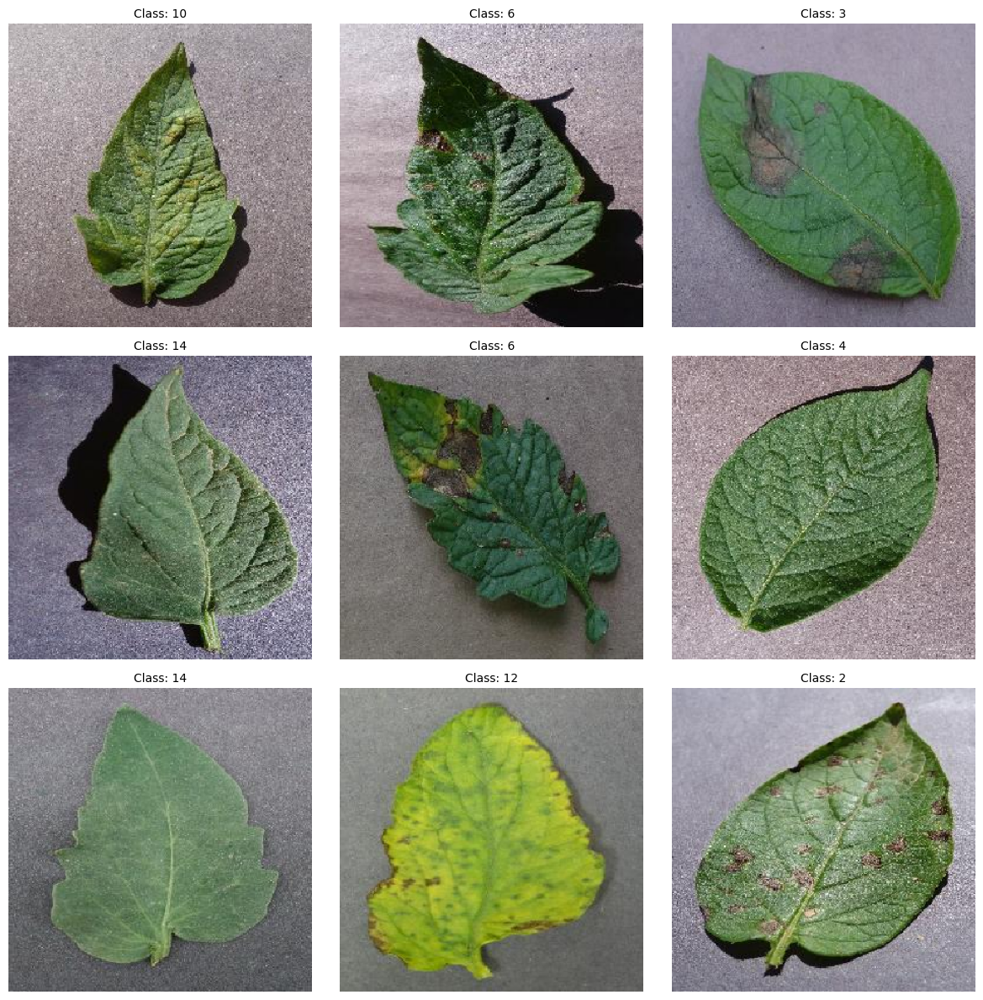

In [28]:
show_augmented_images(training_set, training_set.class_indices)

In [29]:
print("Training set class distribution:")
print(training_set.class_indices)
print(training_set.classes[0:20])
print(f"Train samples: {training_set.samples}")

print("="*60)

print("\nTesting set class distribution:")
print(test_set.class_indices)
print(test_set.classes[0:20])
print(f"Test samples: {test_set.samples}")

print("="*60)


print("\nValidation set class distribution:")
print(validation_set.class_indices)
print(validation_set.classes[0:20])
print(f"validation samples: {validation_set.samples}")

Training set class distribution:
{'0': 0, '1': 1, '10': 2, '11': 3, '12': 4, '13': 5, '14': 6, '2': 7, '3': 8, '4': 9, '5': 10, '6': 11, '7': 12, '8': 13, '9': 14}
[6, 12, 10, 12, 3, 13, 0, 2, 10, 0, 10, 12, 12, 2, 0, 11, 1, 14, 14, 2]
Train samples: 16510

Testing set class distribution:
{'0': 0, '1': 1, '10': 2, '11': 3, '12': 4, '13': 5, '14': 6, '2': 7, '3': 8, '4': 9, '5': 10, '6': 11, '7': 12, '8': 13, '9': 14}
[4, 6, 12, 6, 13, 2, 13, 2, 4, 1, 11, 12, 8, 8, 14, 6, 10, 2, 13, 1]
Test samples: 2064

Validation set class distribution:
{'0': 0, '1': 1, '10': 2, '11': 3, '12': 4, '13': 5, '14': 6, '2': 7, '3': 8, '4': 9, '5': 10, '6': 11, '7': 12, '8': 13, '9': 14}
[8, 14, 12, 10, 13, 3, 14, 4, 9, 1, 2, 2, 12, 6, 0, 2, 12, 6, 14, 0]
validation samples: 2064


## MODELS

In [30]:
from tensorflow.keras.applications import ResNet152V2, InceptionV3, MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [31]:
def create_resnet152v2_model(num_classes=15, input_shape=(224, 224, 3),learning_rate=0.0001):
    # ResNet152V2 modelini yükle
    base_model = ResNet152V2(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Modelin çıkışına ek katmanlar
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    
    # Modeli oluştur
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(
    optimizer=Adam(learning_rate=learning_rate),
    loss='categorical_crossentropy',  # Kategorik sınıflandırma için
    metrics=['accuracy']  # Performans metriği olarak doğruluk
    )
    return model

In [32]:
def create_inceptionv3_model(num_classes=15, input_shape=(299, 299, 3),learning_rate=0.0001):
    # InceptionV3 modelini yükle
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Modelin çıkışına ek katmanlar
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    
    # Modeli oluştur
    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',  # Kategorik sınıflandırma için
        metrics=['accuracy']  # Performans metriği olarak doğruluk
    )
    return model

In [193]:
def create_mobilenetv2_model(num_classes=15, input_shape=(224, 224, 3),learning_rate=0.0001):
    # MobileNetV2 modelini yükle
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Modelin çıkışına ek katmanlar
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    
    # Modeli oluştur
    model = Model(inputs=base_model.input, outputs=predictions)

    # Modeli derle (Adam optimize edicisi ile)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',  # Kategorik sınıflandırma için
        metrics=['accuracy']  # Performans metriği olarak doğruluk
    )
    return model

In [33]:
from sklearn.utils import class_weight

labels = train_df['encoded_labels'].values
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels),
    y=labels
)
class_weights = dict(enumerate(class_weights))
print("Class Weights:", class_weights)

Class Weights: {0: 1.3793650793650793, 1: 0.9312464749012972, 2: 0.8208302261993538, 3: 0.9801721579103592, 4: 0.42880145435657707, 5: 3.6937360178970917, 6: 0.8646766169154229, 7: 1.3759166666666667, 8: 1.3759166666666667, 9: 9.022404371584699, 10: 0.6471095434058397, 11: 1.3759166666666667, 12: 0.7208469766426544, 13: 1.4445319335083115, 14: 0.7768054575394024}


In [34]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, verbose=1)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)
model_checkpoint = ModelCheckpoint('best_model_original.keras', monitor='val_loss', save_best_only=True, verbose=1)

In [35]:
# model = create_resnet152v2_model(num_classes=15) # make images 224x224
# model = create_mobilenetv2_model(num_classes=15) # make images 224x224
model = create_inceptionv3_model(num_classes=15) # make images 229x229

I0000 00:00:1747669898.035056      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [36]:
history = model.fit(
    training_set,
    validation_data=validation_set,
    epochs=10,
    class_weight=class_weights,
    callbacks=[early_stopping, lr_scheduler, model_checkpoint],
    verbose=1
)

Epoch 1/10


I0000 00:00:1747669960.843242     116 service.cc:148] XLA service 0x7eb9b4002c50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747669960.844183     116 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1747669967.298559     116 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1747670011.861699     116 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


425/516 ━━━━━━━━━━━━━━━━━━━━ 33s 364ms/step - accuracy: 0.7685 - loss: 0.9482
Epoch 1: val_loss improved from inf to 0.11298, saving model to best_model_original.keras
516/516 ━━━━━━━━━━━━━━━━━━━━ 316s 407ms/step - accuracy: 0.7916 - loss: 0.8495 - val_accuracy: 0.9637 - val_loss: 0.1130 - learning_rate: 1.0000e-04
Epoch 2/10
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.9785 - loss: 0.0596
Epoch 2: val_loss did not improve from 0.11298
516/516 ━━━━━━━━━━━━━━━━━━━━ 121s 235ms/step - accuracy: 0.9786 - loss: 0.0596 - val_accuracy: 0.9695 - val_loss: 0.1167 - learning_rate: 1.0000e-04
Epoch 3/10
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - accuracy: 0.9847 - loss: 0.0397
Epoch 3: val_loss improved from 0.11298 to 0.07702, saving model to best_model_original.keras
516/516 ━━━━━━━━━━━━━━━━━━━━ 123s 239ms/step - accuracy: 0.9847 - loss: 0.0397 - val_accuracy: 0.9767 - val_loss: 0.0770 - learning_rate: 1.0000e-04
Epoch 4/10
516/516 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - accuracy: 0.

In [ ]:
# saving the model to disk but
# ❌ pickle.dump() is not the correct method for Keras models.
# print("[INFO] Saving model...")
# pickle.dump(model,open('last_mobilenet_model.pkl', 'wb')) # 

In [ ]:
# ✅ save the entire model with model.save() (the most recommended method)
model.save("last_mobilenet_model.keras") # this is accurate then pkl file 
# model.save_weights("mobilenet_weights.h5") # i m not using this because if i use i have to compile model again

## EVALUATION

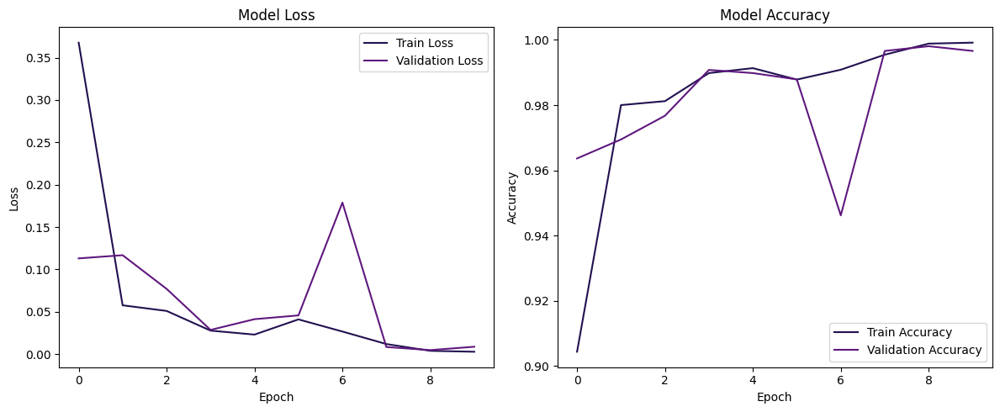

In [ ]:
# Eğitim geçmişini görselleştirme
def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    # Loss
    ax1.plot(history.history['loss'], label='Train Loss')
    ax1.plot(history.history['val_loss'], label='Validation Loss')
    ax1.set_title('Model Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    
    # Accuracy
    ax2.plot(history.history['accuracy'], label='Train Accuracy')
    ax2.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax2.set_title('Model Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()

plot_training_history(history)

In [ ]:
test_loss, test_accuracy = model.evaluate(test_set)
print(f"Test Accuracy: {test_accuracy:.5f}")
print(f"Test Loss: {test_loss:.5f}")

65/65 ━━━━━━━━━━━━━━━━━━━━ 15s 231ms/step - accuracy: 0.9969 - loss: 0.0193
Test Accuracy: 0.99709
Test Loss: 0.01456


In [ ]:
val_loss, val_accuracy = model.evaluate(validation_set)
print(f"validation Accuracy: {val_accuracy:.5f}")
print(f"validation Loss: {val_loss:.5f}")

65/65 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9988 - loss: 0.0041
validation Accuracy: 0.99806
validation Loss: 0.00471


In [ ]:
y_pred = model.predict(test_set)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_set.classes

65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step


In [ ]:
print("Sınıf Sayısı:", len(label_encoder.classes_))
print("Sınıf İsimleri:", label_encoder.classes_)
classes = label_encoder.classes_

Sınıf Sayısı: 15
Sınıf İsimleri: ['Pepper__bell___Bacterial_spot' 'Pepper__bell___healthy'
 'Potato___Early_blight' 'Potato___Late_blight' 'Potato___healthy'
 'Tomato_Bacterial_spot' 'Tomato_Early_blight' 'Tomato_Late_blight'
 'Tomato_Leaf_Mold' 'Tomato_Septoria_leaf_spot'
 'Tomato_Spider_mites_Two_spotted_spider_mite' 'Tomato__Target_Spot'
 'Tomato__Tomato_YellowLeaf__Curl_Virus' 'Tomato__Tomato_mosaic_virus'
 'Tomato_healthy']


### Confusion Matrix

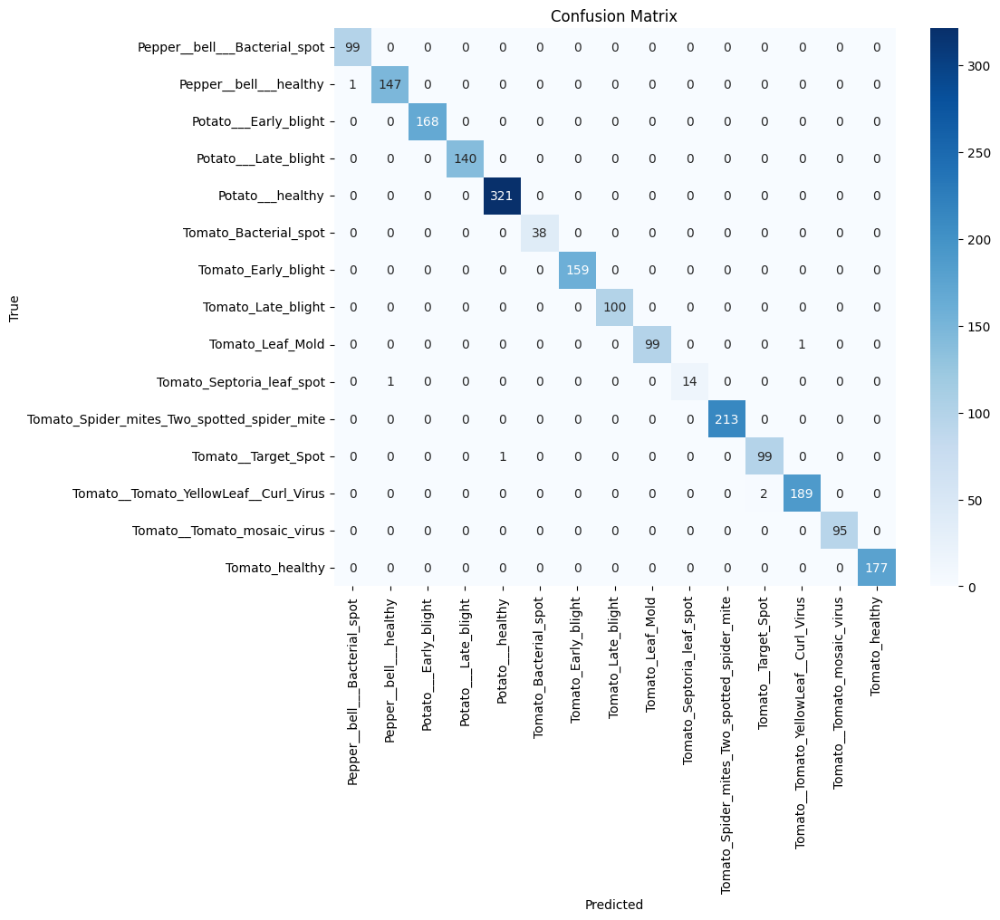

In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### Class-wise Metrics - classification_report

In [ ]:
from sklearn.metrics import classification_report
print("\nClass-wise Metrics:")
print(classification_report(y_true, y_pred_classes, target_names=classes))


Class-wise Metrics:
                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.99      1.00      0.99        99
                     Pepper__bell___healthy       0.99      0.99      0.99       148
                      Potato___Early_blight       1.00      1.00      1.00       168
                       Potato___Late_blight       1.00      1.00      1.00       140
                           Potato___healthy       1.00      1.00      1.00       321
                      Tomato_Bacterial_spot       1.00      1.00      1.00        38
                        Tomato_Early_blight       1.00      1.00      1.00       159
                         Tomato_Late_blight       1.00      1.00      1.00       100
                           Tomato_Leaf_Mold       1.00      0.99      0.99       100
                  Tomato_Septoria_leaf_spot       1.00      0.93      0.97        15
Tomato_Spider_mites_Two_spotted_spider_mite

### ROC Curves for Multi-Class

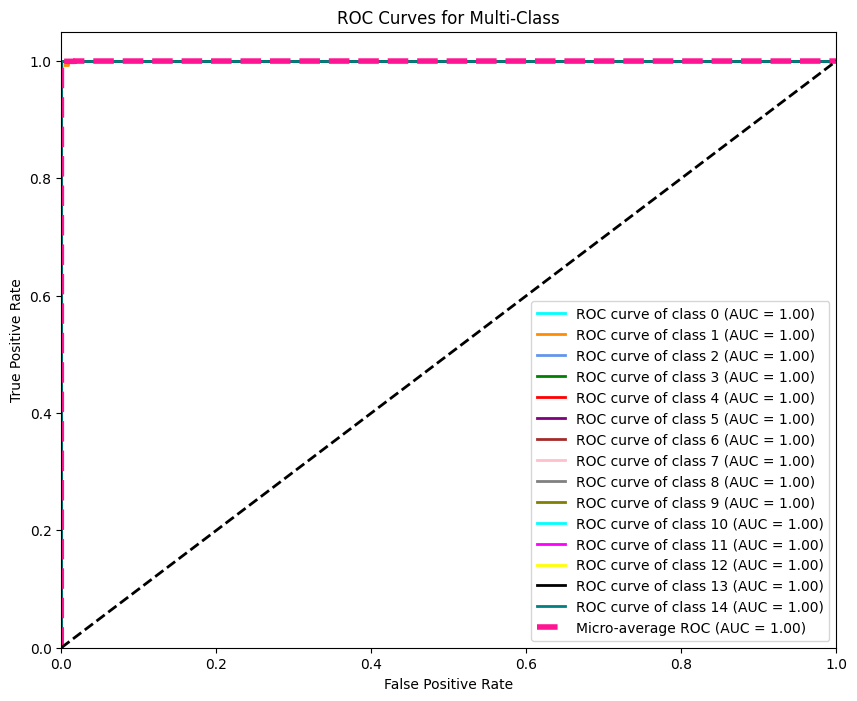

In [ ]:
# ROC Curve (Çok sınıflı)
y_true_bin = label_binarize(y_true, classes=np.arange(15))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Mikro ortalama ROC
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure(figsize=(10, 8))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta', 'yellow', 'black', 'teal'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'ROC curve of class {i} (AUC = {roc_auc[i]:.2f})')
plt.plot(fpr["micro"], tpr["micro"], color='deeppink', linestyle='--', lw=4, label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Multi-Class')
plt.legend(loc="lower right")
plt.show()

### Overall Specificity

In [ ]:
# Çapraz doğruluk matrisi
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Metrikler
accuracy = accuracy_score(y_true, y_pred_classes)
precision = precision_score(y_true, y_pred_classes, average='weighted')
recall = recall_score(y_true, y_pred_classes, average='weighted')
f1 = f1_score(y_true, y_pred_classes, average='weighted')

# Specificity hesaplama
specificities = []
for i in range(conf_matrix.shape[0]):  # Her sınıf için hesaplama
    TP = conf_matrix[i, i]  # True Positive
    FP = np.sum(conf_matrix[:, i]) - TP  # False Positive
    TN = np.sum(conf_matrix) - (np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i]) - TP)  # True Negative
    FN = np.sum(conf_matrix[i, :]) - TP  # False Negative
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0  # Specificity, sıfıra bölme kontrolü
    specificities.append(specificity)
    print(f"Specificity for class {classes[i]}: {specificity:.4f}")

# Genel specificity (ortalama)
overall_specificity = np.mean(specificities)
print(f"Overall Specificity: {overall_specificity:.4f}")

# Diğer metrikleri yazdır
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Specificity for class Pepper__bell___Bacterial_spot: 0.9995
Specificity for class Pepper__bell___healthy: 0.9995
Specificity for class Potato___Early_blight: 1.0000
Specificity for class Potato___Late_blight: 1.0000
Specificity for class Potato___healthy: 0.9994
Specificity for class Tomato_Bacterial_spot: 1.0000
Specificity for class Tomato_Early_blight: 1.0000
Specificity for class Tomato_Late_blight: 1.0000
Specificity for class Tomato_Leaf_Mold: 1.0000
Specificity for class Tomato_Septoria_leaf_spot: 1.0000
Specificity for class Tomato_Spider_mites_Two_spotted_spider_mite: 1.0000
Specificity for class Tomato__Target_Spot: 0.9990
Specificity for class Tomato__Tomato_YellowLeaf__Curl_Virus: 0.9995
Specificity for class Tomato__Tomato_mosaic_virus: 1.0000
Specificity for class Tomato_healthy: 1.0000
Overall Specificity: 0.9998
Accuracy: 0.9971
Precision: 0.9971
Recall: 0.9971
F1 Score: 0.9971


### Multi Metrics

In [ ]:
# Metrikler (Çok sınıflı için uyarlandı)
mcc = matthews_corrcoef(y_true, y_pred_classes)
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

accuracy = accuracy_score(y_true, y_pred_classes)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_true, y_pred_classes, average='weighted')
print(f"Precision (Weighted): {precision:.4f}")

recall = recall_score(y_true, y_pred_classes, average='weighted')
print(f"Recall (Weighted): {recall:.4f}")

f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f"F1 Score (Weighted): {f1:.4f}")

kappa = cohen_kappa_score(y_true, y_pred_classes)
print(f"Cohen's Kappa Score: {kappa:.4f}")

logloss = log_loss(y_true_bin, y_pred)
print(f"Log Loss: {logloss:.4f}")

balanced_acc = balanced_accuracy_score(y_true, y_pred_classes)
print(f"Balanced Accuracy: {balanced_acc:.4f}")

f2 = fbeta_score(y_true, y_pred_classes, beta=2, average='weighted')
print(f"F2 Score (Weighted): {f2:.4f}")

jaccard = jaccard_score(y_true, y_pred_classes, average='weighted')
print(f"Jaccard Index (Weighted): {jaccard:.4f}")

hamming = hamming_loss(y_true, y_pred_classes)
print(f"Hamming Loss: {hamming:.4f}")

Matthews Correlation Coefficient (MCC): 0.9968
Accuracy: 0.9971
Precision (Weighted): 0.9971
Recall (Weighted): 0.9971
F1 Score (Weighted): 0.9971
Cohen's Kappa Score: 0.9968
Log Loss: 0.0270
Balanced Accuracy: 0.9931
F2 Score (Weighted): 0.9971
Jaccard Index (Weighted): 0.9942
Hamming Loss: 0.0029


### Precision-Recall Curves for Multi-Class

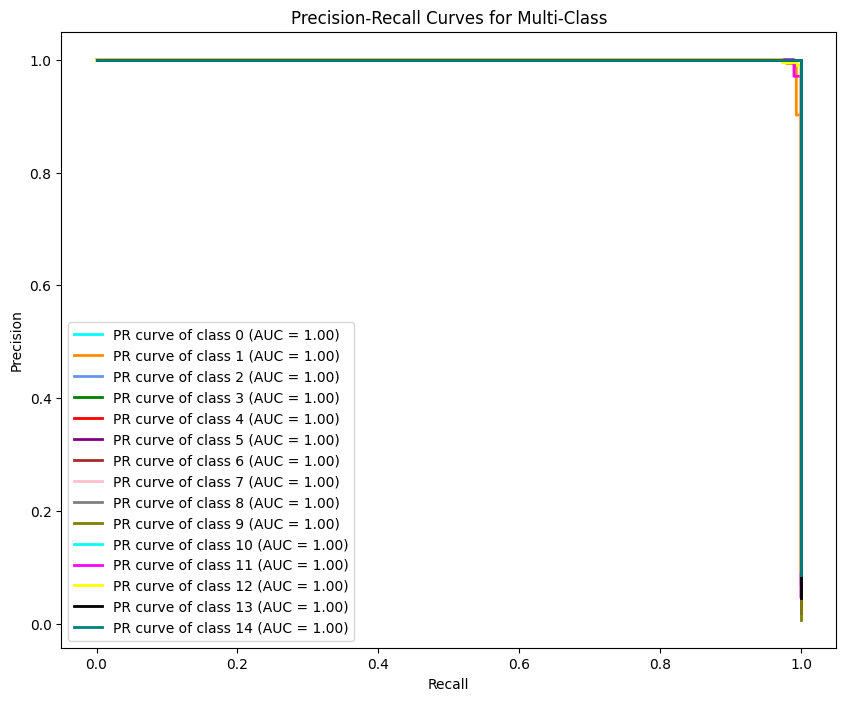

In [ ]:
from sklearn.metrics import precision_recall_curve
precision_pr = dict()
recall_pr = dict()
pr_auc = dict()
for i in range(n_classes):
    precision_pr[i], recall_pr[i], _ = precision_recall_curve(y_true_bin[:, i], y_pred[:, i])
    pr_auc[i] = auc(recall_pr[i], precision_pr[i])

plt.figure(figsize=(10, 8))
for i, color in zip(range(n_classes), colors):
    plt.plot(recall_pr[i], precision_pr[i], color=color, lw=2, label=f'PR curve of class {i} (AUC = {pr_auc[i]:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves for Multi-Class')
plt.legend(loc="lower left")
plt.show()

### Predict single image

In [52]:
from tensorflow.keras.preprocessing import image

img_path = '/kaggle/input/plantdisease/PlantVillage/Pepper__bell___healthy/00100ffa-095e-4881-aebf-61fe5af7226e___JR_HL 7886.JPG'

img = image.load_img(img_path, target_size=(299, 299))  # InceptionV3 için 299x299
img_array = image.img_to_array(img)
img_array = img_array / 255.0
img_array = np.expand_dims(img_array, axis=0)  # (1, 299, 299, 3)

pred = model.predict(img_array)
predicted_class_index = np.argmax(pred)

print("Tahmin edilen sınıf indexi:", predicted_class_index)

predicted_label = classes[predicted_class_index]
print("Tahmin edilen sınıf ismi:", predicted_label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Tahmin edilen sınıf indexi: 1
Tahmin edilen sınıf ismi: Pepper__bell___healthy
